# **安裝模組**

## **Nixtla**

In [ ]:
Nixtla_Install = None
try:
  Nixtla_Install = !pip install -Uqq nixtla datasetsforecast utilsforecast

except Exception:
  import locale
  def getpreferredencoding(do_setlocale = True):
      return "UTF-8"
  locale.getpreferredencoding = getpreferredencoding
  Nixtla_Install

## **Supabase**

In [ ]:
!pip -q install supabase

## **Dask**

In [ ]:
!pip install dask[dataframe]

INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.2/242.2 kB 4.6 MB/s eta 0:00:00


## **RAPID**

In [ ]:
!pip install \
    --extra-index-url=https://pypi.nvidia.com \
    cudf-cu12==24.8.* dask-cudf-cu12==24.8.* cuml-cu12==24.8.* \
    cugraph-cu12==24.8.* cuspatial-cu12==24.8.* cuproj-cu12==24.8.* \
    cuxfilter-cu12==24.8.* cucim-cu12==24.8.* pylibraft-cu12==24.8.* \
    raft-dask-cu12==24.8.* cuvs-cu12==24.8.* nx-cugraph-cu12==24.8.*

## **python-dateutil**

In [ ]:
!pip install python-dateutil

## **holidays**

In [ ]:
!pip install -U holidays

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.3 MB/s eta 0:00:00
  Attempting uninstall: holidays
    Found existing installation: holidays 0.57
    Uninstalling holidays-0.57:
      Successfully uninstalled holidays-0.57


# **啟用RAPID cuDF加速Pandas (需啟用GPU)**

In [ ]:
GPU_Available = !nvidia-smi

if GPU_Available.s.split(":")[-1].strip() == 'command not found':
  print("未啟用GPU")
else:
  print("已啟用GPU")
  # https://rapids.ai/cudf-pandas/
  %load_ext cudf.pandas

未啟用GPU


# **載入模組**

In [ ]:
import os
import requests
import json
import pandas as pd
import datetime
import holidays # 詳細假期 (holidays模組) [首選]
import dask.dataframe as dd
from dateutil import parser, relativedelta
from pprint import pprint
from io import StringIO
from google.colab import userdata # Google Colab適用
#from kaggle_secrets import UserSecretsClient # Kaggle適用
from holidays.utils import list_supported_countries # 假期支援的國家 (內建)
from nixtla import NixtlaClient
from nixtla.date_features import CountryHolidays # 假期 (nixtla模組) [次選]
from nixtla.date_features import SpecialDates # 自訂特殊節日 (nixtla模組)
from datasetsforecast.long_horizon import LongHorizon
from utilsforecast.losses import mae, mse, rmse
from supabase import create_client, Client

try:
    user_secrets = UserSecretsClient() # Kaggle適用
except Exception:
    pass

# **載入環境變數**

In [ ]:
Get_ENV_Value = lambda key: userdata.get(key) or os.environ.get(key) or None # Kaggle: user_secrets.get_secret(key)
Custom = lambda x: str(x) or None # 手動設置

In [ ]:
# Supabase (資料庫)
SUPABASE_URL = Get_ENV_Value("SUPABASE_URL") or Custom("")
SUPABASE_KEY = Get_ENV_Value("SUPABASE_KEY") or Custom("")

# TDX - 交通壅塞資料
TDX_Client_ID = Get_ENV_Value("TDX_Client_ID") or Custom("")
TDX_Client_Secret = Get_ENV_Value("TDX_Client_Secret") or Custom("")
TDX_AccessToken = Get_ENV_Value("TDX_AccessToken") or Custom("")

# NIXTLA - TimeGPT
NIXTLA_API = Get_ENV_Value("NIXTLA_API") or Custom("")

# **儲存TDX壅塞歷史資料至Supabase資料庫[棄用]**

## **TDX資料取得相關模組**

In [ ]:
# 取得授權
class GetAccessToken():
    def __init__(self, app_id, app_key):
        self.__auth_url = "https://tdx.transportdata.tw/auth/realms/TDXConnect/protocol/openid-connect/token"
        self.app_id = app_id
        self.app_key = app_key

    def get_auth_header(self):
        content_type = 'application/x-www-form-urlencoded'
        grant_type = 'client_credentials'

        return{
            'content-type' : content_type,
            'grant_type' : grant_type,
            'client_id' : self.app_id,
            'client_secret' : self.app_key
        }

    def run(self):
        AccessToken_Res = requests.post(self.__auth_url, self.get_auth_header())
        AccessToken = AccessToken_Res.json().get('access_token')
        pprint(AccessToken_Res.text, indent=2)
        return AccessToken


# 抓取資料
class Fetch_Data():
    def __init__(self, token, url):
        self.token = token
        self.url = url

    def get_data_header(self):
        return {
            'authorization': 'Bearer ' + self.token,
            'Accept-Encoding': 'br,gzip'
        }

    def run(self):
        Data_Res = requests.get(self.url, headers=self.get_data_header())
        Data = Data_Res
        #pprint(Data_Res.text, indent=2)
        return Data

## **取得TDX Token授權**

In [ ]:
Client_ID = TDX_Client_ID
Client_Secret = TDX_Client_Secret
AccessToken = TDX_AccessToken

In [ ]:
try:
    if (AccessToken) is None:
      AccessToken = GetAccessToken(Client_ID, Client_Secret).run()

    print(f'AccessToken: {AccessToken}')
except Exception as e:
    print(f"TDX Token授權取得失敗 {e}")

AccessToken: eyJhbGciOiJSUzI1NiIsInR5cCIgOiAiSldUIiwia2lkIiA6ICJER2lKNFE5bFg4WldFajlNNEE2amFVNm9JOGJVQ3RYWGV6OFdZVzh3ZkhrIn0.eyJleHAiOjE3MjU5NTU1MDAsImlhdCI6MTcyNTg2OTEwMCwianRpIjoiYTYzY2IwNmUtYjE0Yy00MzFkLThjNjItY2MyNWE3OTdkNmRhIiwiaXNzIjoiaHR0cHM6Ly90ZHgudHJhbnNwb3J0ZGF0YS50dy9hdXRoL3JlYWxtcy9URFhDb25uZWN0Iiwic3ViIjoiNWY1NmQ0MGQtYzM3ZC00MzNmLWI5MWMtZDA5NzYwNzZkZmY2IiwidHlwIjoiQmVhcmVyIiwiYXpwIjoiYjExMDU2MDUxLWI0YzdkZjQ3LTE1YjktNDAzZSIsImFjciI6IjEiLCJyZWFsbV9hY2Nlc3MiOnsicm9sZXMiOlsic3RhdGlzdGljIiwicHJlbWl1bSIsInBhcmtpbmdGZWUiLCJtYWFzIiwiYWR2YW5jZWQiLCJnZW9pbmZvIiwidmFsaWRhdG9yIiwidG91cmlzbSIsImhpc3RvcmljYWwiLCJiYXNpYyJdfSwic2NvcGUiOiJwcm9maWxlIGVtYWlsIiwidXNlciI6IjNiYzg4NzVlIn0.ShRo9j9Pw9vvHm5QpltHeHev9rsqhqO-40ATM86RUoFyoiE_Pe4p6QJBMFqxPc4m-C4wEpqz-n9eLNcwkfc5lf1qMRceUb4xa5NuPJ0BluJdJzx6_eorWy9p7ux4EsRbqqIA-NaCdM2Q2gKXP4BCuttZMDl1R4nUUSiRc3m6k9wOOXRNP_s5-l9Cn9dhL3c_r_63xjIvyYTZt5TyXIq88sBZz_cwSF6RpDUFAm-ysDdFcWnDzTQ2rKcAoijQ9k1tmF0DYGSlYAxDjJ3eBPjMsS5y5Isxv4P0hOARrcJylnd0_Y2xjbzLMhx

## **取得TDX壅塞歷史資料**

In [ ]:
import datetime

## 取得特定天數前的日期
def Get_Past_Date(past_day, tz_offset):
    Date = datetime.datetime.now(tz=datetime.timezone(datetime.timedelta(hours=tz_offset))) - datetime.timedelta(days=past_day)
    Date = Date.strftime('%Y-%m-%d')
    return Date

In [ ]:
Date = Get_Past_Date(3, +8)
TDX_Historical_Urls = f'https://tdx.transportdata.tw/api/historical/v2/Historical/Road/Traffic/Live/Freeway?Dates={Date}&format=JSONL'
TDX_Historical_Urls

'https://tdx.transportdata.tw/api/historical/v2/Historical/Road/Traffic/Live/Freeway?Dates=2024-09-07&format=JSONL'

In [ ]:
Data = None
print("抓取TDX壅塞歷史資料中...\n")
Data = Fetch_Data(AccessToken, TDX_Historical_Urls).run()
#print(json.dumps(Data, ensure_ascii=False, indent=2))
print("\n抓取成功!")

抓取TDX壅塞歷史資料中...


抓取成功!


In [ ]:
import re

print(Data.content)

# **載入資料集**

## **取得儲存於Supabase資料庫的TDX壅塞資料**

In [ ]:
# 建立 Supabase (資料庫) 物件
url: str = SUPABASE_URL
key: str = SUPABASE_KEY
supabase: Client = create_client(url, key)

In [ ]:
# 取得所有壅塞資料並轉成CSV
response = supabase.table("Live_Data") \
                .select("*") \
                .csv() \
                .execute()

In [ ]:
# 載入資料集
columns = ['section_id', 'level', 'update_time', 'update_interval', 'travel_time', 'travel_speed']
df = pd.read_csv(StringIO(response.data), sep=",", names=columns, skiprows=[0], dtype={'section_id': object, 'level': object})
df.head()

,section_id,level,update_time,update_interval,travel_time,travel_speed
1849670,0019,1,2024-09-11 16:00:00+00,60,237,96
1849671,0013,1,2024-09-11 17:00:00+00,60,99,91
1849672,0017,1,2024-09-11 18:00:00+00,60,61,94
1849673,0039,1,2024-09-11 19:00:00+00,60,70,95
1849674,0057,1,2024-09-11 20:00:00+00,60,169,92


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 247953 entries, 1849670 to 1839644
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   section_id       247953 non-null  object
 1   level            247953 non-null  object
 2   update_time      247953 non-null  object
 3   update_interval  247953 non-null  int64 
 4   travel_time      247953 non-null  int64 
 5   travel_speed     247953 non-null  int64 
dtypes: int64(3), object(3)
memory usage: 13.2+ MB


In [ ]:
df.describe()

,update_interval,travel_time,travel_speed
count,247953.0,247953.000000,247953.000000
mean,60.0,169.112179,90.766129
std,0.0,115.057160,16.458381
min,60.0,0.000000,-2.000000
25%,60.0,83.000000,86.000000
50%,60.0,145.000000,93.000000
75%,60.0,226.000000,99.000000
max,60.0,2782.000000,250.000000


# **資料預處理**

## **格式化日期(update_time)**

In [ ]:
df['update_time'] = df['update_time'].apply(lambda x: (parser.parse(x) + relativedelta.relativedelta(hours=8))) # .strftime('%Y-%m-%d %H:%M:%S')
df.head()

,section_id,level,update_time,update_interval,travel_time,travel_speed
1849670,0019,1,2024-09-12 00:00:00+00:00,60,237,96
1849671,0013,1,2024-09-12 01:00:00+00:00,60,99,91
1849672,0017,1,2024-09-12 02:00:00+00:00,60,61,94
1849673,0039,1,2024-09-12 03:00:00+00:00,60,70,95
1849674,0057,1,2024-09-12 04:00:00+00:00,60,169,92


## **資料缺失值處理**

In [ ]:
# 檢查各column是否有缺失值
df.isna().any()

,0
section_id,False
level,False
update_time,False
update_interval,False
travel_time,False
travel_speed,False


In [ ]:
# 缺失值總數
df.isna().sum()

,0
section_id,0
level,0
update_time,0
update_interval,0
travel_time,0
travel_speed,0


## **資料重複值處理[勿執行]**

In [ ]:
# 檢查重複值
df[df.duplicated()]

,section_id,level,update_time,update_interval,travel_time,travel_speed
1849856,0425,1,2024-09-11 00:00:00+00:00,60,211,93
1849857,0021,2,2024-09-11 01:00:00+00:00,60,81,79
1849858,0023,1,2024-09-11 02:00:00+00:00,60,76,92
1849859,0001,2,2024-09-11 03:00:00+00:00,60,50,78
1849860,0443,1,2024-09-11 04:00:00+00:00,60,382,93
...,...,...,...,...,...,...
1325987,0019,1,2024-09-12 00:00:00+00:00,60,237,96
1460608,0001,2,2024-09-12 06:00:00+00:00,60,50,77
1462956,0013,1,2024-09-12 01:00:00+00:00,60,99,91
1560031,0017,1,2024-09-12 02:00:00+00:00,60,61,94


In [ ]:
#df.drop_duplicates(inplace=True)

In [ ]:
df['section_id'].value_counts()

,count
section_id,
0017,299
0007,296
0001,295
0419,293
0037,293
...,...
2142,282
0213,282
0114,282


## **刪除無效日期資料**

In [ ]:
df2 = df.copy()
df2

,section_id,level,update_time,update_interval,travel_time,travel_speed
1849670,0019,1,2024-09-12 00:00:00+00:00,60,237,96
1849671,0013,1,2024-09-12 01:00:00+00:00,60,99,91
1849672,0017,1,2024-09-12 02:00:00+00:00,60,61,94
1849673,0039,1,2024-09-12 03:00:00+00:00,60,70,95
1849674,0057,1,2024-09-12 04:00:00+00:00,60,169,92
...,...,...,...,...,...,...
1839640,0152,1,2024-09-12 06:17:00+00:00,60,82,95
1839641,0167,1,2024-09-12 06:17:00+00:00,60,35,89
1839642,0171,1,2024-09-12 06:17:00+00:00,60,150,85
1839643,0203,1,2024-09-12 06:17:00+00:00,60,255,100


In [ ]:
invalid_date = df2[df['update_time'].apply(lambda x: str(x) < '2024-01-01')]

if (not invalid_date.empty):
  print("存在無效日期資料")
  df2 = df[df['update_time'].apply(lambda x: str(x) >= '2024-01-01')]
else:
  print("不存在無效日期資料")

invalid_date

不存在無效日期資料


,section_id,level,update_time,update_interval,travel_time,travel_speed


In [ ]:
df2.sort_values(by='update_time')['update_time'].value_counts(sort=False, dropna=False).index.to_list()

[Timestamp('2024-09-05 00:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 01:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 02:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 03:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 04:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 05:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 06:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 07:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 08:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 09:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 10:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 11:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 12:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 13:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 14:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 15:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 16:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 17:00:00+0000', tz='tzloc

## **排序日期**

In [ ]:
# 檢查排序結果
df2.sort_values(by='update_time')['update_time'].value_counts(sort=False, dropna=False).index.to_list()

[Timestamp('2024-09-05 00:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 01:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 02:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 03:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 04:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 05:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 06:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 07:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 08:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 09:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 10:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 11:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 12:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 13:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 14:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 15:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 16:00:00+0000', tz='tzlocal()'),
 Timestamp('2024-09-05 17:00:00+0000', tz='tzloc

In [ ]:
# 進行排序
df2.sort_values(by='update_time', inplace=True)

In [ ]:
# 排序結果
df2

,section_id,level,update_time,update_interval,travel_time,travel_speed
1928176,0104,1,2024-09-05 00:00:00+00:00,60,200,98
1928123,0246,1,2024-09-05 00:00:00+00:00,60,319,106
1928124,2090,1,2024-09-05 00:00:00+00:00,60,80,90
1928125,0250,1,2024-09-05 00:00:00+00:00,60,260,99
1928126,2251,1,2024-09-05 00:00:00+00:00,60,96,97
...,...,...,...,...,...,...
1849691,0017,2,2024-09-12 21:00:00+00:00,60,73,76
1849668,0089,1,2024-09-12 22:00:00+00:00,60,215,93
1849692,0089,1,2024-09-12 22:00:00+00:00,60,215,93
1849669,0017,2,2024-09-12 23:00:00+00:00,60,70,77


### **查看資料時間範圍**

In [ ]:
max_date = df2['update_time'].max()
min_date = df2['update_time'].min()
print(f"時間範圍: {min_date} ~ {max_date}")
print(f"總天數: {(max_date - min_date)}")

時間範圍: 2024-09-05 00:00:00+00:00 ~ 2024-09-12 23:00:00+00:00
總天數: 7 days 23:00:00


## **資料擴充**

In [ ]:
df3 = df2.copy()
df3

,section_id,level,update_time,update_interval,travel_time,travel_speed
1928176,0104,1,2024-09-05 00:00:00+00:00,60,200,98
1928123,0246,1,2024-09-05 00:00:00+00:00,60,319,106
1928124,2090,1,2024-09-05 00:00:00+00:00,60,80,90
1928125,0250,1,2024-09-05 00:00:00+00:00,60,260,99
1928126,2251,1,2024-09-05 00:00:00+00:00,60,96,97
...,...,...,...,...,...,...
1849691,0017,2,2024-09-12 21:00:00+00:00,60,73,76
1849668,0089,1,2024-09-12 22:00:00+00:00,60,215,93
1849692,0089,1,2024-09-12 22:00:00+00:00,60,215,93
1849669,0017,2,2024-09-12 23:00:00+00:00,60,70,77


### **原資料集擴充周末、假期特徵**

In [ ]:
# = = = = = 擴充周末、假期特徵模組 = = = = =
def Extend_Weekend_Holiday(df, dates_range=None, country='TW', holiday_language='zh_TW'):
    # 設置日期範圍(原資料集日期範圍)
    min_date = df['update_time'].min()
    max_date = df['update_time'].max()
    min_year = min_date.year
    max_year = max_date.year
    if dates_range is None:
      del dates_range
      #dates_range = pd.date_range(start=min_date, end=max_date, freq='H')
      # 因擁有不同路段ID，所以可包含重複時間
      dates_range = df['update_time'].value_counts().index.to_list()

    # 檢查假期物件是否支援所選國家(有空list就算支援)
    holidays_country_support = list_supported_countries().get(country)
    if not isinstance(holidays_country_support, list):
      print(f'假期物件不支持所選國家')
      return

    # >>>>>>>>>>>> 擴充假期(Holiday) <<<<<<<<<<<<
    ## 方法一 (假期較不完整，nixtla模組):
    ###TW_holidays = CountryHolidays(countries=[country])

    ## 方法二 (假期較完整，holidays模組):
    ### 取得台灣假期
    TW_holidays = {}
    for year in range(min_year, max_year + 1):
      TW_holidays.update(holidays.country_holidays(country=country, years=year, observed=True)) # language=holiday_language
    TW_holidays_list = sorted(TW_holidays.items())
    TW_holidays_dict = {}
    ### 重新調整假期資料格式
    for date, name in TW_holidays_list:
      TW_holidays_dict[name].append(date) if name in TW_holidays_dict else TW_holidays_dict.setdefault(name, [date])
      #print(f'{date} = {name}')

    # >>>>>>>>>>>> 擴充六、日周末(Weekend) <<<<<<<<<<<<
    ## 所有週六(SUN)時間
    SUN_list = pd.date_range(start=str(min_year), end=str(int(max_year)+1), freq='W-SUN').tolist()
    ## 所有週日(SAT)時間
    SAT_list = pd.date_range(start=str(min_year), end=str(int(max_year)+1), freq='W-SAT').tolist()
    ## 所有周末時間
    Weekend_list = sorted(SUN_list + SAT_list)
    ## 將周末資料新增至假期資料
    TW_holidays_dict.setdefault('Weekend', Weekend_list)

    # >>>>>>>>>>>> 將假期、周末轉換成DataFrame <<<<<<<<<<<<
    ## 設定台灣假期資料框
    holidays_dates = SpecialDates(
        special_dates=TW_holidays_dict
    )
    ## 設定時間範圍(依照原資料集的所有時間)
    holidays_df = holidays_dates(dates_range)
    ## 將index重命名為update_time
    holidays_df.reset_index(inplace=True)
    holidays_df.rename(columns={'index': 'update_time'}, inplace=True)
    holidays_df.sort_values(by='update_time', inplace=True)
    """
    holidays_df.insert(loc=0, column='update_time', value=holidays_df.index)
    holidays_df.set_index([pd.Series(index=range(0, holidays_df.shape[0]))])
    #holidays_df = holidays_df.groupby(['update_time'], as_index=False).sum()
    holidays_df.reset_index(inplace=True)
    holidays_df.drop(['index'], axis=1, inplace=True)
    holidays_df.sort_values(by='update_time', inplace=True)
    holidays_df.reset_index(inplace=True)
    holidays_df.drop(['index'], axis=1, inplace=True)
    """

    # >>>>>>>>>>>> 將周末、假期資料框時間範圍與原資料框同步 <<<<<<<<<<<<
    # 因會刪除重複時間，因此不必要
    #holidays_df = holidays_df[holidays_df['update_time'].apply(lambda x: x.hour).isin(df['update_time'].apply(lambda x: x.hour).unique())]

    # >>>>>>>>>>>> 將創建的周末、假期資料框與原資料框合併 <<<<<<<<<<<<
    # 記憶體用量極大，因此在外部依照個別ID合併即可
    #Result_df = pd.merge(left=df, right=holidays_df, on='update_time', how="left")
    #print(df['update_time'].shape)
    #print(holidays_df['update_time'].shape)
    return holidays_df

Weekend_Holiday_df = Extend_Weekend_Holiday(df3)

In [ ]:
Weekend_Holiday_df

,update_time,Founding Day of the Republic of China,Day off (substituted from 02/17/2024),Chinese New Year's Eve,Chinese New Year,Chinese New Year (observed),Peace Memorial Day,Children's Day; Tomb Sweeping Day,Children's Day (observed),Dragon Boat Festival,Mid-Autumn Festival,National Day,Weekend
55,2024-09-06 00:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
73,2024-09-06 01:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
282,2024-09-06 02:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
281,2024-09-06 03:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
280,2024-09-06 04:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
401,2024-09-12 19:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
398,2024-09-12 20:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
397,2024-09-12 21:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0
394,2024-09-12 22:00:00+00:00,0,0,0,0,0,0,0,0,0,0,0,0


### **新增外生變數(Exogenous variables)**

In [ ]:
'''
# 擴充要預測的測試集各日期周末特徵欄位(參考future_df)
future_df_2 = future_df.copy()

test_dates = pd.date_range(start=test['update_time'].min(), end=test['update_time'].max(), freq='H')
test_dates_df = pd.DataFrame({ 'update_time': test_dates })
test_dates_df['section_id'] = test['section_id'].unique().tolist()
future_df_2 = pd.concat([future_df_2, test_dates_df])
future_df_2
'''

In [ ]:
'''
# 創建移除預測目標的周末"外部變數"資料框
future_df = df3[['section_id', 'update_time', 'is_weekend']]
future_df
'''

In [ ]:
# 手動創建周末欄位資料框 (未來一個月):
"""
future_dates = pd.date_range(start=df3['update_time'].min(), end=pd.to_datetime(df3['update_time'].min()) + relativedelta.relativedelta(months=1), freq='H')
future_dates_df = pd.DataFrame({ 'update_time': future_dates })
future_dates_df['is_weekend'] = future_dates_df['update_time'].dt.dayofweek >= 5
future_dates_df['is_weekend'] = future_dates_df['is_weekend'].map({True: 1, False: 0})
future_dates_df
"""

## **資料分割(訓練、測試、外生變數)**

In [ ]:
import traceback

class PredictError(Exception):
    pass

# 資料集分割，因每個section_id所擁有的時間不一致，因此需依照個別section_id分割出訓練、外生變數出來
# 此函數分兩部分: 上半部不分割資料，
def Train_Exo_Split(df, holidays_df, predict_h, has_test=True, split_id=True):
    """
    - 函數說明:
     - 資料集分割，因每個section_id所擁有的時間不一致，因此需依照個別section_id分割出`訓練`、`外生變數`出來。
     - 當 has_test 設為 `False` 時，表示無須測試集，則分割出原資料集及外生變數資料集。
    - 註:
     - 外生變數資料集無須包含目標值，只需包含時間及外生特徵。
     - 因資料龐大，因此該函式製作成yield生成器 (重要!!!)。
    ---
    - 參數說明:
     - df: 要分割的資料。
     - holidays_df: 要分割的資料所擁有的時間範圍的外生變數資料集。
     - predict_h: 預測小時。
     - has_test: 是否包含測試集，預設為 `True`，將會把原資料集分割出訓練、測試集(當作外生變數，不包含目標值)。
     - split_id: 是否分ID分割
    ---
    - Return: [train, exo]
     - train: 訓練集。
     - exo: 測試集或外生變數資料集。
    """

    if not split_id:
      df = df.merge(right=holidays_df, on='update_time', how="left")
      time_len = df['update_time'].value_counts(sort=False, dropna=False).index.shape[0]

      # 檢查是否有時段
      if(time_len > 0):
        #print(f'{section_id} 時間數量 = {time_len}')

        # 取得時間範圍每小時數量 [待修正]
        hours_len = df['update_time'].shape[0]

        # 如包含測試集，則直接分割 [待修正]
        if has_test:
          # 檢查預測時間是否超過可預測範圍
          if predict_h > hours_len:
            raise PredictError(f"預測小時超過資料集本身時間範圍，請縮小預測時間，\n資料集時間長度: {time_len}")

          train = df.iloc[predict_h:, :]
          exo = df.iloc[:predict_h, :]

          # 檢查預測時間是否按照每小時順序(因為預測時段亦是如此)，否則換下一個路段ID
          curr_time = pd.to_datetime("now")
          train_exo = pd.concat([train.iloc[[-1]], exo])
          train_exo['update_time'] = pd.to_datetime(train_exo['update_time']).dt.tz_localize(None)
          components = (train_exo['update_time'] - curr_time).std().components
          if (components.days != 1) and (components.hours != 1):
            print(components)
            print(f"\n路段ID = {section_id}，預測時間序列非每小時排序，請嘗試其他預測長度。")
            #continue

          return train, exo
        else:
          # 當未包含測試集，則生成額外外生變數資料集
          exo = pd.DataFrame()
          for section_id in df['section_id'].unique().tolist():

            exo_section_df = df[df['section_id'] == section_id]

            exo_dates = pd.date_range(start=exo_section_df['update_time'].max(), end=exo_section_df['update_time'].max() + pd.DateOffset(hours=predict_h), freq='h')
            exo_dates_df = pd.DataFrame({ 'update_time': exo_dates })
            exo_dates_df['section_id'] = section_id
            exo_hoildays_df = Extend_Weekend_Holiday(exo_dates_df)
            exo_hoildays_df = exo_dates_df.merge(right=exo_hoildays_df, on='update_time', how="left") # exo_hoildays_df
            exo_hoildays_df = exo_hoildays_df.iloc[1:, :]
            exo = pd.concat([exo, exo_hoildays_df])

          return df, exo
      else:
        print('無時間')
    else:
      def Split_Generator():
        for section_id in df['section_id'].unique().tolist():
          # 篩選時間，因預測頻率為每小時，因此只需保留每小時資料
          '''
          df.sort_values(by='update_time', inplace=True)
          df_2 = df.copy()
          df_2['update_time'] = df_2['update_time'].apply(lambda x: (x.day, x.hour))
          df_2.drop_duplicates(subset=['section_id', 'update_time'], inplace=True)
          df = df[df.index.isin(df_2.index)]
          '''

          section_df = df[df['section_id'] == section_id].merge(right=holidays_df, on='update_time', how="left")
          time_len = section_df['update_time'].value_counts(sort=False, dropna=False).index.shape[0]

          # 檢查是否有時段
          if(time_len > 0):
            print(f'{section_id} 時間數量 = {time_len}')

            # 取得時間範圍每小時數量
            hours_len = section_df['update_time'].shape[0]

            # 如包含測試集，則直接分割
            if has_test:
              # 檢查預測時間是否超過可預測範圍
              if predict_h > hours_len:
                raise PredictError(f"預測小時超過資料集本身時間範圍，請縮小預測時間，\n資料集時間長度: {time_len}")

              train = section_df.iloc[predict_h:, :]
              exo = section_df.iloc[:predict_h, :]

              # 檢查預測時間是否按照每小時順序(因為預測時段亦是如此)，否則換下一個路段ID
              curr_time = pd.to_datetime("now")
              train_exo = pd.concat([train.iloc[[-1]], exo])
              train_exo['update_time'] = pd.to_datetime(train_exo['update_time']).dt.tz_localize(None)
              components = (train_exo['update_time'] - curr_time).std().components
              if (components.days != 1) and (components.hours != 1):
                print(components)
                print(f"\n路段ID = {section_id}，預測時間序列非每小時排序，請嘗試其他預測長度。")
                #continue

              yield train, exo
            else:
              # 當未包含測試集，則生成額外外生變數資料集
              #exo = pd.DataFrame()
              #for section_id in df['section_id'].unique().tolist():

              #exo_section_df = df[df['section_id'] == section_id]

              exo_dates = pd.date_range(start=section_df['update_time'].max(), end=section_df['update_time'].max() + pd.DateOffset(hours=predict_h), freq='h')
              exo_dates_df = pd.DataFrame({ 'update_time': exo_dates })
              exo_dates_df['section_id'] = section_id
              exo_hoildays_df = Extend_Weekend_Holiday(exo_dates_df)
              exo = exo_dates_df.merge(right=exo_hoildays_df, on='update_time', how="left") # exo_hoildays_df
              exo = exo.iloc[1:, :]
              #exo = pd.concat([exo, exo_hoildays_df])

              yield section_df, exo
          else:
            print(f'{section_id} 無時間 = {time_len}')
      Split_Generator()

# **模型訓練、預測**

## **Nixtla TimeGPT模型**
- **timegpt-1: 短期預測**
- **timegpt-1-long-horizon: 長期預測**

### **建立Nixtla Client物件**

In [ ]:
# 建立Nixtla Client物件
nixtla_client = NixtlaClient(
    api_key = NIXTLA_API
)

### **驗證 API 金鑰**

In [ ]:
# 驗證 API 金鑰
nixtla_client.validate_api_key()

True

### **查看每時段的路段平均車速圖表**

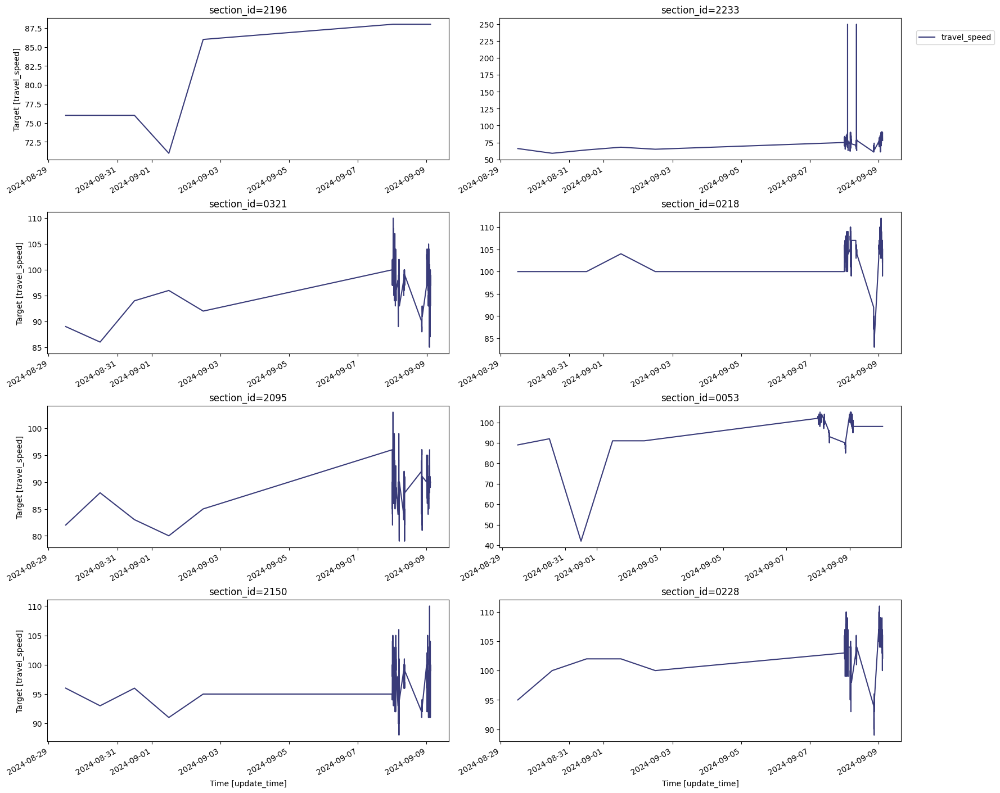

In [ ]:
# 顯示每時段的路段平均車速圖表
nixtla_client.plot(
    df3,
    id_col='section_id',
    unique_ids=df3['section_id'].value_counts().index.tolist(),
    time_col='update_time',
    target_col='travel_speed',
    max_insample_length=df3['section_id'].count()
)

### **查看特定路段個時段平均車速**

<Axes: title={'center': 'section_id = 0054'}, xlabel='travel speed', ylabel='time'>

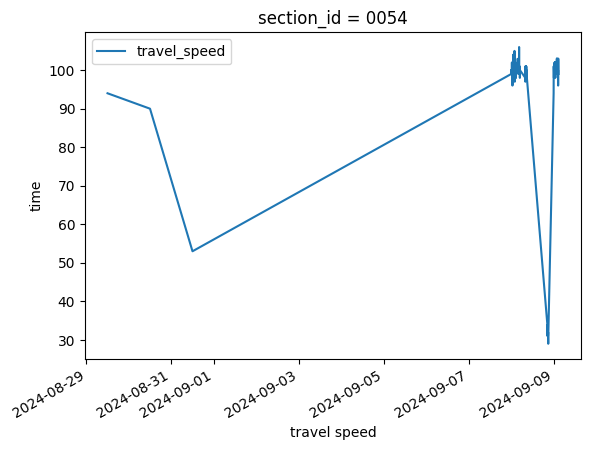

In [ ]:
# 查看特定路段個時段平均車速
section_id = '0054'

df3[(
    (df3['section_id'] == section_id) & (df3['update_time'].apply(lambda x: x.day) >= 8)
)].plot(
    title=f'section_id = {section_id}',
    xlabel='travel speed',
    ylabel='time',
    x='update_time',
    y='travel_speed',
    kind='line'
)

### **設定預測配置**

#### [**跳至正式預測**](#scrollTo=4A9SS4k29Zv6&uniqifier=12)

In [ ]:
Long_Predict = False # 是否長期預測
Predict_hours = 6 # 單位(小時)
ID_Col = 'section_id' # 每個系列ID
X_Label = 'update_time' # 特徵
Y_Label = 'travel_speed' # 目標值
check_loss = False # 是否檢查損失函數 (如True則需分訓練、測試)
split_section_id = False # 是否按ID分割 (如True，則為生成器)

if Long_Predict:
  model_name = 'timegpt-1-long-horizon'
else:
  model_name = 'timegpt-1'

### **分割訓練、測試集 (查看損失函數用)**

In [ ]:
Train_Exo_Split_Generator = Train_Exo_Split(
    df=df3,
    holidays_df=Weekend_Holiday_df,
    predict_h=Predict_hours,
    has_test=check_loss,
    split_id=split_section_id
)

In [ ]:
if not split_section_id:
  train, exo = Train_Exo_Split_Generator
else:
  Train_Exo_Split_Generator

In [ ]:
if not split_section_id:
  train.info()

In [ ]:
if not split_section_id:
  exo.info()

### **長期/短期預測**

In [ ]:
# = = = = = 預測測試集路段平均車速 (分ID預測，資料量大專用) = = = = =
# 2024/09/14筆記: 預測時會針對每個id生成預測小時
# 2024/09/14筆記: 每個id所擁有的時間序列不一致，因此周末外部變數形狀會對不上，而預測失敗，所以必須區分id來訓練
# 2024/09/14筆記: 分id後預測時數就能隨意設置，然後外部變數X_df可根據預測多少小時去擴大周末範圍即可

fcst_total_df = pd.DataFrame()
for train, exo in Train_Exo_Split_Generator:
    '''
    train = train[(train['update_time'] >= '2024-09-08 00:00:00') & (train['update_time'] < '2024-09-08 04:00:00')]
    train.reset_index(inplace=True)
    train.drop(['index'], axis=1, inplace=True)
    train = train[['section_id', 'level', 'update_time', 'travel_speed']]
    print(train)
    '''
    #print(train['update_time'].unique())
    #print(exo['update_time'].unique())
    fcst_df = nixtla_client.forecast(
        df=train,
        h=Predict_hours, # 預測測試集總時數
        freq='h',
        finetune_loss="mae",
        model=model_name,
        id_col=ID_Col,
        time_col=X_Label,
        target_col=Y_Label,
        #level=[80, 90],
        X_df=exo
    )
    fcst_total_df = pd.concat([fcst_total_df, fcst_df])

In [ ]:
fcst_total_df

,section_id,update_time,TimeGPT
0,2258,2024-09-12 08:54:00+00:00,44.626090
1,2258,2024-09-12 09:54:00+00:00,45.090935
2,2258,2024-09-12 10:54:00+00:00,45.651157
3,2258,2024-09-12 11:54:00+00:00,46.267857
4,2258,2024-09-12 12:54:00+00:00,46.818398
...,...,...,...
1,2142,2024-09-12 09:55:00+00:00,93.778860
2,2142,2024-09-12 10:55:00+00:00,93.780810
3,2142,2024-09-12 11:55:00+00:00,93.881750
4,2142,2024-09-12 12:55:00+00:00,93.988846


In [ ]:
# = = = = = 預測測試集路段平均車速 (不分ID一次預測) = = = = =
#train = dd.from_pandas(train, npartitions=1)

fcst_df = nixtla_client.forecast(
    df=train,
    h=Predict_hours, # 預測測試集總時數
    freq='h',
    finetune_loss="mae",
    model=model_name,
    id_col=ID_Col,
    time_col=X_Label,
    target_col=Y_Label,
    #level=[80, 90],
    X_df=exo
)

In [ ]:
fcst_df

,section_id,update_time,TimeGPT
0,0001,2024-09-12 08:54:00+00:00,70.567406
1,0001,2024-09-12 09:54:00+00:00,70.726776
2,0001,2024-09-12 10:54:00+00:00,70.873810
3,0001,2024-09-12 11:54:00+00:00,70.937164
4,0001,2024-09-12 12:54:00+00:00,70.993430
...,...,...,...
3655,2276,2024-09-12 09:55:00+00:00,34.461870
3656,2276,2024-09-12 10:55:00+00:00,34.625717
3657,2276,2024-09-12 11:55:00+00:00,34.427475
3658,2276,2024-09-12 12:55:00+00:00,34.998466


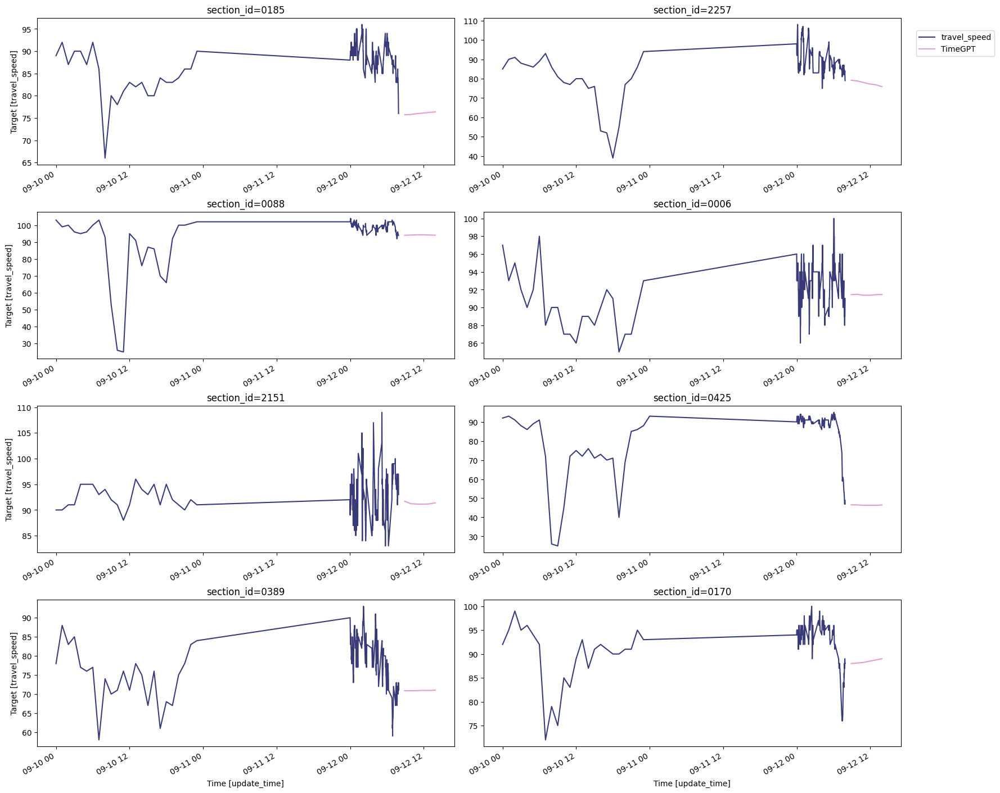

In [ ]:
# 圖表
nixtla_client.plot(train, fcst_df, id_col='section_id', time_col='update_time', target_col='travel_speed')

# **模型評估**

## **長期預測**

In [ ]:
# 調整預測集時間與測試集時間相等
fcst_df = fcst_df[fcst_df['update_time'].apply(lambda x: x.hour).isin(test['update_time'].apply(lambda x: x.hour).unique())]
fcst_df

,section_id,update_time,TimeGPT
23,0001,2024-08-31 12:00:00,2
47,0001,2024-09-01 12:00:00,2
71,0001,2024-09-02 12:00:00,2
95,0002,2024-08-31 12:00:00,3
119,0002,2024-09-01 12:00:00,3
...,...,...,...
43823,2275,2024-09-01 12:00:00,2
43847,2275,2024-09-02 12:00:00,2
43871,2276,2024-08-31 12:00:00,1
43895,2276,2024-09-01 12:00:00,1


In [ ]:
# 將預測結果合併至測試集
test_long = test.copy()
test_long.loc[:, 'TimeGPT'] = fcst_df['TimeGPT'].values

### **MAE**

In [ ]:
# MAE
MAE_Long_Evaluation = mae(test_long, models=['TimeGPT'], id_col='section_id', target_col='level')
MAE_Long_Evaluation

,section_id,TimeGPT
0,0001,1.000000
1,0002,1.000000
2,0003,0.000000
3,0004,0.000000
4,0005,0.000000
...,...,...
605,2264,0.000000
606,2265,0.333333
607,2266,1.000000
608,2275,0.333333


In [ ]:
# 平均MAE分數
MAE_Long_Avg = MAE_Long_Evaluation['TimeGPT'].mean()
print(f'平均MAE分數: {round(MAE_Long_Avg, 5)}')

平均MAE分數: 0.40055


### **MSE**

In [ ]:
# MAE
MSE_Long_Evaluation = mse(test_long, models=['TimeGPT'], id_col='section_id', target_col='level')
MSE_Long_Evaluation

,section_id,TimeGPT
0,0001,1.000000
1,0002,1.666667
2,0003,0.000000
3,0004,0.000000
4,0005,0.000000
...,...,...
605,2264,0.000000
606,2265,0.333333
607,2266,1.000000
608,2275,0.333333


In [ ]:
# 平均MSE分數
MSE_Long_Avg = MSE_Long_Evaluation['TimeGPT'].mean()
print(f'平均MSE分數: {round(MSE_Long_Avg, 5)}')

平均MSE分數: 0.61038


### **RMSE**

In [ ]:
# RMAE
RMSE_Long_Evaluation = rmse(test_long, models=['TimeGPT'], id_col='section_id', target_col='level')
RMSE_Long_Evaluation

,section_id,TimeGPT
0,0001,1.000000
1,0002,1.290994
2,0003,0.000000
3,0004,0.000000
4,0005,0.000000
...,...,...
605,2264,0.000000
606,2265,0.577350
607,2266,1.000000
608,2275,0.577350


In [ ]:
# 平均RMAE分數
RMSE_Long_Avg = RMSE_Long_Evaluation['TimeGPT'].mean()
print(f'平均RMSE分數: {round(RMSE_Long_Avg, 5)}')

平均RMSE分數: 0.55615


## **短期預測**

In [ ]:
# 調整預測集時間與測試集時間相等
fcst_short_df = fcst_short_df[fcst_short_df['update_time'].apply(lambda x: x.hour).isin(test['update_time'].apply(lambda x: x.hour).unique())]
fcst_short_df

,section_id,update_time,TimeGPT
23,0001,2024-08-31 12:00:00,2
47,0001,2024-09-01 12:00:00,2
71,0001,2024-09-02 12:00:00,2
95,0002,2024-08-31 12:00:00,3
119,0002,2024-09-01 12:00:00,3
...,...,...,...
43823,2275,2024-09-01 12:00:00,2
43847,2275,2024-09-02 12:00:00,2
43871,2276,2024-08-31 12:00:00,1
43895,2276,2024-09-01 12:00:00,1


In [ ]:
# 將預測結果合併至測試集
test_short = test.copy()
test_short.loc[:, 'TimeGPT'] = fcst_short_df['TimeGPT'].values

### **MAE**

In [ ]:
# MAE
MAE_Short_Evaluation = mae(test_short, models=['TimeGPT'], id_col='section_id', target_col='level')
MAE_Short_Evaluation

,section_id,TimeGPT
0,0001,1.000000
1,0002,1.000000
2,0003,0.000000
3,0004,0.000000
4,0005,0.000000
...,...,...
605,2264,0.000000
606,2265,0.333333
607,2266,1.000000
608,2275,0.333333


In [ ]:
# 平均MAE分數
MAE_Short_Avg = MAE_Short_Evaluation['TimeGPT'].mean()
print(f'平均MAE分數: {round(MAE_Short_Avg, 5)}')

平均MAE分數: 0.40219


### **MSE**

In [ ]:
# MAE
MSE_Short_Evaluation = mse(test_short, models=['TimeGPT'], id_col='section_id', target_col='level')
MSE_Short_Evaluation

,section_id,TimeGPT
0,0001,1.000000
1,0002,1.666667
2,0003,0.000000
3,0004,0.000000
4,0005,0.000000
...,...,...
605,2264,0.000000
606,2265,0.333333
607,2266,1.000000
608,2275,0.333333


In [ ]:
# 平均MSE分數
MSE_Short_Avg = MSE_Short_Evaluation['TimeGPT'].mean()
print(f'平均MSE分數: {round(MSE_Short_Avg, 5)}')

平均MSE分數: 0.61421


### **RMSE**

In [ ]:
# RMAE
RMSE_Short_Evaluation = rmse(test_short, models=['TimeGPT'], id_col='section_id', target_col='level')
RMSE_Short_Evaluation

,section_id,TimeGPT
0,0001,1.000000
1,0002,1.290994
2,0003,0.000000
3,0004,0.000000
4,0005,0.000000
...,...,...
605,2264,0.000000
606,2265,0.577350
607,2266,1.000000
608,2275,0.577350


In [ ]:
## 平均RMAE分數
RMSE_Short_Avg = RMSE_Short_Evaluation['TimeGPT'].mean()
print(f'平均RMSE分數: {round(RMSE_Short_Avg, 5)}')

平均RMSE分數: 0.5582


## **綜合比較**

In [ ]:
print("= = = = = 長期 = = = = =")
print(f'長期預測平均MAE分數: {round(MAE_Long_Avg, 5)}')
print(f'長期預測平均MSE分數: {round(MSE_Long_Avg, 5)}')
print(f'長期預測平均RMSE分數: {round(RMSE_Long_Avg, 5)}')

print("\n= = = = = 短期 = = = = =")
print(f'短期預測平均MAE分數: {round(MAE_Short_Avg, 5)}')
print(f'短期預測平均MSE分數: {round(MSE_Short_Avg, 5)}')
print(f'短期預測平均RMSE分數: {round(RMSE_Short_Avg, 5)}')

= = = = = 長期 = = = = =
長期預測平均MAE分數: 0.40055
長期預測平均MSE分數: 0.61038
長期預測平均RMSE分數: 0.55615

= = = = = 短期 = = = = =
短期預測平均MAE分數: 0.40219
短期預測平均MSE分數: 0.61421
短期預測平均RMSE分數: 0.5582


# **`結論: 資料較少情況下，長期預測模型準確率較佳，反之短期。`**

# **正式預測**

In [ ]:
df3

,section_id,level,update_time,update_interval,travel_time,travel_speed
1928176,0104,1,2024-09-05 00:00:00+00:00,60,200,98
1928123,0246,1,2024-09-05 00:00:00+00:00,60,319,106
1928124,2090,1,2024-09-05 00:00:00+00:00,60,80,90
1928125,0250,1,2024-09-05 00:00:00+00:00,60,260,99
1928126,2251,1,2024-09-05 00:00:00+00:00,60,96,97
...,...,...,...,...,...,...
1849691,0017,2,2024-09-12 21:00:00+00:00,60,73,76
1849668,0089,1,2024-09-12 22:00:00+00:00,60,215,93
1849692,0089,1,2024-09-12 22:00:00+00:00,60,215,93
1849669,0017,2,2024-09-12 23:00:00+00:00,60,70,77


## **查看資料時間範圍**

In [ ]:
max_date = df3['update_time'].max()
min_date = df3['update_time'].min()
print(f"時間範圍: {min_date} ~ {max_date}")
print(f"總天數: {(max_date - min_date)}")

時間範圍: 2024-09-05 00:00:00+00:00 ~ 2024-09-12 23:00:00+00:00
總天數: 7 days 23:00:00


In [ ]:
import pytz
from datetime import datetime, timezone
from zoneinfo import ZoneInfo

# 預測未來3天總時數
taiwan_date = datetime.now(ZoneInfo('Asia/Taipei'))
total_hour_without_now = (taiwan_date - max_date).days * 24 + (taiwan_date - max_date).seconds // 3600
total_hour_without_now

602

In [ ]:
Long_Predict = True # 是否長期預測
Predict_hours = total_hour_without_now + 24 * 6 # 單位(小時)
ID_Col ='section_id' # 每個系列ID
X_Label = 'update_time' # 特徵
Y_Label = 'travel_speed' # 目標值
check_loss = False # 是否檢查損失函數 (如True則需分訓練、測試)
split_section_id = False # 是否按ID分割 (如True，則為生成器)

if Long_Predict:
  model_name = 'timegpt-1-long-horizon'
else:
  model_name = 'timegpt-1'

In [ ]:
Train_Exo_Split_Generator = Train_Exo_Split(
    df=df3,
    holidays_df=Weekend_Holiday_df,
    predict_h=Predict_hours,
    has_test=check_loss,
    split_id=split_section_id
)

In [ ]:
if not split_section_id:
  train, exo = Train_Exo_Split_Generator
else:
  Train_Exo_Split_Generator

In [ ]:
if not split_section_id:
  train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 247953 entries, 0 to 247952
Data columns (total 18 columns):
 #   Column                                 Non-Null Count   Dtype                    
---  ------                                 --------------   -----                    
 0   section_id                             247953 non-null  object                   
 1   level                                  247953 non-null  object                   
 2   update_time                            247953 non-null  datetime64[ns, tzlocal()]
 3   update_interval                        247953 non-null  int64                    
 4   travel_time                            247953 non-null  int64                    
 5   travel_speed                           247953 non-null  int64                    
 6   Founding Day of the Republic of China  247953 non-null  int64                    
 7   Day off (substituted from 02/17/2024)  247953 non-null  int64                    
 8   Chinese New Ye

In [ ]:
if not split_section_id:
  exo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 455060 entries, 1 to 746
Data columns (total 14 columns):
 #   Column                                 Non-Null Count   Dtype                    
---  ------                                 --------------   -----                    
 0   update_time                            455060 non-null  datetime64[ns, tzlocal()]
 1   section_id                             455060 non-null  object                   
 2   Founding Day of the Republic of China  455060 non-null  int64                    
 3   Day off (substituted from 02/17/2024)  455060 non-null  int64                    
 4   Chinese New Year's Eve                 455060 non-null  int64                    
 5   Chinese New Year                       455060 non-null  int64                    
 6   Chinese New Year (observed)            455060 non-null  int64                    
 7   Peace Memorial Day                     455060 non-null  int64                    
 8   Children's Day; Tomb S

In [ ]:
# = = = = = 預測測試集路段平均車速 (不分ID一次預測) = = = = =
#train = dd.from_pandas(train, npartitions=1)

Traffic_fcst_df = nixtla_client.forecast(
    df=train,
    h=Predict_hours, # 預測測試集總時數
    freq='h',
    finetune_loss="mae",
    model=model_name,
    id_col=ID_Col,
    time_col=X_Label,
    target_col=Y_Label,
    #level=[80, 90],
    X_df=exo
)
Traffic_fcst_df

,section_id,update_time,TimeGPT
0,0001,2024-09-12 08:54:00+00:00,70.760390
1,0001,2024-09-12 09:54:00+00:00,70.825966
2,0001,2024-09-12 10:54:00+00:00,70.881320
3,0001,2024-09-12 11:54:00+00:00,70.942406
4,0001,2024-09-12 12:54:00+00:00,70.931900
...,...,...,...
455055,2276,2024-10-13 05:55:00+00:00,20.010303
455056,2276,2024-10-13 06:55:00+00:00,19.856250
455057,2276,2024-10-13 07:55:00+00:00,19.878086
455058,2276,2024-10-13 08:55:00+00:00,19.710659


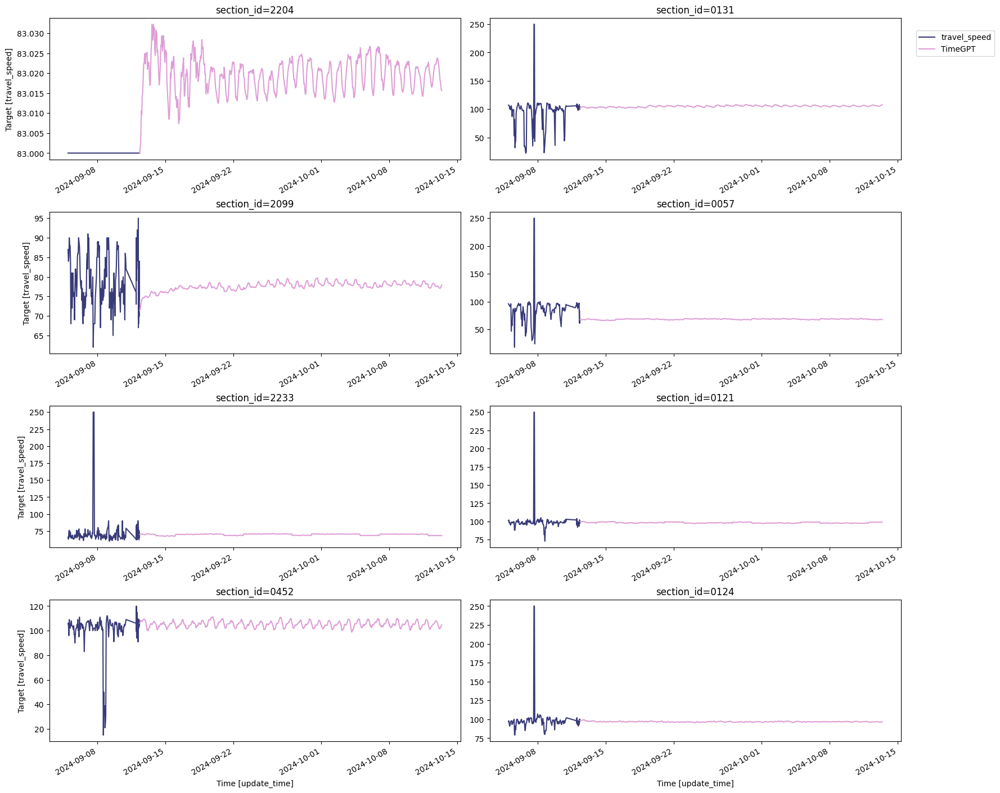

In [ ]:
# 圖表
nixtla_client.plot(train, Traffic_fcst_df, id_col='section_id', time_col='update_time', target_col='travel_speed')

# **儲存模型預測結果至Supabase資料庫**

In [ ]:
TDX_Forecast_Data = Traffic_fcst_df.copy()
TDX_Forecast_Data

,section_id,update_time,TimeGPT
0,0001,2024-09-12 08:54:00+00:00,70.760390
1,0001,2024-09-12 09:54:00+00:00,70.825966
2,0001,2024-09-12 10:54:00+00:00,70.881320
3,0001,2024-09-12 11:54:00+00:00,70.942406
4,0001,2024-09-12 12:54:00+00:00,70.931900
...,...,...,...
455055,2276,2024-10-13 05:55:00+00:00,20.010303
455056,2276,2024-10-13 06:55:00+00:00,19.856250
455057,2276,2024-10-13 07:55:00+00:00,19.878086
455058,2276,2024-10-13 08:55:00+00:00,19.710659


In [ ]:
# update_interval = 60
TDX_Forecast_Data['update_interval'] = 60
TDX_Forecast_Data

,section_id,update_time,TimeGPT,update_interval
0,0001,2024-09-12 08:54:00+00:00,70.760390,60
1,0001,2024-09-12 09:54:00+00:00,70.825966,60
2,0001,2024-09-12 10:54:00+00:00,70.881320,60
3,0001,2024-09-12 11:54:00+00:00,70.942406,60
4,0001,2024-09-12 12:54:00+00:00,70.931900,60
...,...,...,...,...
455055,2276,2024-10-13 05:55:00+00:00,20.010303,60
455056,2276,2024-10-13 06:55:00+00:00,19.856250,60
455057,2276,2024-10-13 07:55:00+00:00,19.878086,60
455058,2276,2024-10-13 08:55:00+00:00,19.710659,60


In [ ]:
TDX_Forecast_Data = TDX_Forecast_Data.rename(columns={'TimeGPT': 'travel_speed'})
TDX_Forecast_Data

,section_id,update_time,travel_speed,update_interval
0,0001,2024-09-12 08:54:00+00:00,70.760390,60
1,0001,2024-09-12 09:54:00+00:00,70.825966,60
2,0001,2024-09-12 10:54:00+00:00,70.881320,60
3,0001,2024-09-12 11:54:00+00:00,70.942406,60
4,0001,2024-09-12 12:54:00+00:00,70.931900,60
...,...,...,...,...
455055,2276,2024-10-13 05:55:00+00:00,20.010303,60
455056,2276,2024-10-13 06:55:00+00:00,19.856250,60
455057,2276,2024-10-13 07:55:00+00:00,19.878086,60
455058,2276,2024-10-13 08:55:00+00:00,19.710659,60


In [ ]:
# 篩選時間(指定12點，只保留今日以後的時間)
# (TDX_Forecast_Data['update_time'].apply(lambda x: x.hour) == 12) &
TDX_Forecast_Data = TDX_Forecast_Data[(TDX_Forecast_Data['update_time'].apply(lambda x: x.date()) > datetime.date(datetime.now()))]
TDX_Forecast_Data

,section_id,update_time,travel_speed,update_interval
640,0001,2024-10-09 00:54:00+00:00,71.823180,60
641,0001,2024-10-09 01:54:00+00:00,71.864440,60
642,0001,2024-10-09 02:54:00+00:00,71.984985,60
643,0001,2024-10-09 03:54:00+00:00,72.113450,60
644,0001,2024-10-09 04:54:00+00:00,72.149730,60
...,...,...,...,...
455055,2276,2024-10-13 05:55:00+00:00,20.010303,60
455056,2276,2024-10-13 06:55:00+00:00,19.856250,60
455057,2276,2024-10-13 07:55:00+00:00,19.878086,60
455058,2276,2024-10-13 08:55:00+00:00,19.710659,60


In [ ]:
import datetime

# 將時間減8小時並%Z加8
TDX_Forecast_Data.loc[:, 'update_time'] = pd.to_datetime(TDX_Forecast_Data['update_time'].apply(lambda x: (x - datetime.timedelta(hours=8)))).dt.tz_convert('Asia/Taipei')
TDX_Forecast_Data

,section_id,update_time,travel_speed,update_interval
640,0001,2024-10-08 16:54:00+00:00,71.823180,60
641,0001,2024-10-08 17:54:00+00:00,71.864440,60
642,0001,2024-10-08 18:54:00+00:00,71.984985,60
643,0001,2024-10-08 19:54:00+00:00,72.113450,60
644,0001,2024-10-08 20:54:00+00:00,72.149730,60
...,...,...,...,...
455055,2276,2024-10-12 21:55:00+00:00,20.010303,60
455056,2276,2024-10-12 22:55:00+00:00,19.856250,60
455057,2276,2024-10-12 23:55:00+00:00,19.878086,60
455058,2276,2024-10-13 00:55:00+00:00,19.710659,60


In [ ]:
# 四捨五入行車平均速率
TDX_Forecast_Data.loc[:, 'travel_speed'] = TDX_Forecast_Data['travel_speed'].apply(lambda x: round(x))
TDX_Forecast_Data['travel_speed'] = TDX_Forecast_Data['travel_speed'].astype(int)
TDX_Forecast_Data

<ipython-input-40-9f9e579d30b2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  TDX_Forecast_Data['travel_speed'] = TDX_Forecast_Data['travel_speed'].astype(int)


,section_id,update_time,travel_speed,update_interval
640,0001,2024-10-08 16:54:00+00:00,72,60
641,0001,2024-10-08 17:54:00+00:00,72,60
642,0001,2024-10-08 18:54:00+00:00,72,60
643,0001,2024-10-08 19:54:00+00:00,72,60
644,0001,2024-10-08 20:54:00+00:00,72,60
...,...,...,...,...
455055,2276,2024-10-12 21:55:00+00:00,20,60
455056,2276,2024-10-12 22:55:00+00:00,20,60
455057,2276,2024-10-12 23:55:00+00:00,20,60
455058,2276,2024-10-13 00:55:00+00:00,20,60


In [ ]:
# 新增壅塞等級
# 參考: https://tdx.transportdata.tw/api/basic/v2/Road/Traffic/CongestionLevel/Freeway?%24top=30&%24format=JSON
"""
最順暢: 80 <= travel_speed => Level = 1
順暢: 60 <= travel_speed < 79 => Level = 2
正常: 40 <= travel_speed < 59 => Level = 3
壅塞: 20 <= travel_speed < 39 => Level = 4
最壅塞: 0 <= travel_speed < 19 => Level = 5
道路封閉: travel_speed = -1 => Level = -1
"""
TDX_Forecast_Data.loc[:, 'level'] = TDX_Forecast_Data['travel_speed'].apply(lambda x: 1 if x >= 80 else (2 if x >= 60 else (3 if x >= 40 else (4 if x >= 20 else (5 if x >= 0 else -1)))))
TDX_Forecast_Data

<ipython-input-41-43a0b28e97af>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  TDX_Forecast_Data.loc[:, 'level'] = TDX_Forecast_Data['travel_speed'].apply(lambda x: 1 if x >= 80 else (2 if x >= 60 else (3 if x >= 40 else (4 if x >= 20 else (5 if x >= 0 else -1)))))


,section_id,update_time,travel_speed,update_interval,level
640,0001,2024-10-08 16:54:00+00:00,72,60,2
641,0001,2024-10-08 17:54:00+00:00,72,60,2
642,0001,2024-10-08 18:54:00+00:00,72,60,2
643,0001,2024-10-08 19:54:00+00:00,72,60,2
644,0001,2024-10-08 20:54:00+00:00,72,60,2
...,...,...,...,...,...
455055,2276,2024-10-12 21:55:00+00:00,20,60,4
455056,2276,2024-10-12 22:55:00+00:00,20,60,4
455057,2276,2024-10-12 23:55:00+00:00,20,60,4
455058,2276,2024-10-13 00:55:00+00:00,20,60,4


In [ ]:
min_date = TDX_Forecast_Data['update_time'].min()
max_date = TDX_Forecast_Data['update_time'].max()
print(f"時間範圍: {min_date} ~ {max_date}")
print(f"總天數: {(max_date - min_date)}")

時間範圍: 2024-10-08 16:00:00+00:00 ~ 2024-10-13 17:00:00+00:00
總天數: 5 days 01:00:00


In [ ]:
# 將預測格式轉為JSON
TDX_Forecast_Json = TDX_Forecast_Data.to_json(orient='records', date_format='iso')
TDX_Forecast_Json = json.loads(TDX_Forecast_Json)
TDX_Forecast_Json

[{'section_id': '0001',
  'update_time': '2024-10-08T16:54:00.000Z',
  'travel_speed': 72,
  'update_interval': 60,
  'level': 2},
 {'section_id': '0001',
  'update_time': '2024-10-08T17:54:00.000Z',
  'travel_speed': 72,
  'update_interval': 60,
  'level': 2},
 {'section_id': '0001',
  'update_time': '2024-10-08T18:54:00.000Z',
  'travel_speed': 72,
  'update_interval': 60,
  'level': 2},
 {'section_id': '0001',
  'update_time': '2024-10-08T19:54:00.000Z',
  'travel_speed': 72,
  'update_interval': 60,
  'level': 2},
 {'section_id': '0001',
  'update_time': '2024-10-08T20:54:00.000Z',
  'travel_speed': 72,
  'update_interval': 60,
  'level': 2},
 {'section_id': '0001',
  'update_time': '2024-10-08T21:54:00.000Z',
  'travel_speed': 72,
  'update_interval': 60,
  'level': 2},
 {'section_id': '0001',
  'update_time': '2024-10-08T22:54:00.000Z',
  'travel_speed': 72,
  'update_interval': 60,
  'level': 2},
 {'section_id': '0001',
  'update_time': '2024-10-08T23:54:00.000Z',
  'travel_spee

In [ ]:
# 儲存壅塞資料
response = (
    supabase.table("Live_Forecast_Data")
    .upsert(TDX_Forecast_Json)
    .execute()
)

In [ ]:
response.json()

'{"data":[{"id":81232,"section_id":"0001","level":"2","update_time":"2024-10-08T16:54:00+00:00","update_interval":60,"travel_time":null,"travel_speed":72},{"id":81233,"section_id":"0001","level":"2","update_time":"2024-10-08T17:54:00+00:00","update_interval":60,"travel_time":null,"travel_speed":72},{"id":81234,"section_id":"0001","level":"2","update_time":"2024-10-08T18:54:00+00:00","update_interval":60,"travel_time":null,"travel_speed":72},{"id":81235,"section_id":"0001","level":"2","update_time":"2024-10-08T19:54:00+00:00","update_interval":60,"travel_time":null,"travel_speed":72},{"id":81236,"section_id":"0001","level":"2","update_time":"2024-10-08T20:54:00+00:00","update_interval":60,"travel_time":null,"travel_speed":72},{"id":81237,"section_id":"0001","level":"2","update_time":"2024-10-08T21:54:00+00:00","update_interval":60,"travel_time":null,"travel_speed":72},{"id":81238,"section_id":"0001","level":"2","update_time":"2024-10-08T22:54:00+00:00","update_interval":60,"travel_time"

In [ ]:
# 刪除資料
'''
response = (
    supabase.table("Live_Forecast_Data") # Live_Data
    .delete()
    .gte('update_time', '2024-09-11 04:00:00+00')
    .execute()
)
'''